# Forced-dissipative barotropic QG beta-plane turbulence


A simulation of forced-dissipative barotropic quasi-geostrophic turbulence on
a beta plane. The dynamics include linear drag and stochastic excitation.

## Install dependencies

First let's make sure we have all required packages installed.

In [1]:
using Pkg; Pkg.activate(".")

  Activating environment at `~/Research/BubbleJets/Project.toml`


## Let's begin
Let's load `GeophysicalFlows.jl` and some other needed packages.

In [2]:
using GeophysicalFlows, Random, Printf, Plots

using LinearAlgebra: mul!, ldiv!
using Statistics: mean

parsevalsum = FourierFlows.parsevalsum # a shortcut
nothing # hide

┌ Info: FourierFlows will use 12 threads
└ @ FourierFlows /Users/navid/.julia/packages/FourierFlows/h8FXj/src/FourierFlows.jl:123


## Choosing a device: CPU or GPU

In [3]:
dev = CPU()     # Device (CPU/GPU)
nothing # hide

## Numerical parameters and time-stepping parameters

In [4]:
      n = 256            # 2D resolution: n² grid points
stepper = "FilteredRK4"  # timestepper
     dt = 0.1            # timestep
 nsteps = 8000           # total number of time-steps
 nsubs  = 10             # number of time-steps for intermediate logging/plotting (nsteps must be multiple of nsubs)
nothing # hide

## Physical parameters

In [5]:
L = 2π        # domain size
β = 10.0      # planetary PV gradient
μ = 0.01      # bottom drag
nothing # hide

## Forcing

We force the vorticity equation with stochastic excitation that is delta-correlated in time
and while spatially homogeneously and isotropically correlated. The forcing has a spectrum
with power in a ring in wavenumber space of radius ``k_f`` (`forcing_wavenumber`) and width
``δ_f`` (`forcing_bandwidth`), and it injects energy per unit area and per unit time
equal to ``\varepsilon``. That is, the forcing covariance spectrum is proportional to
``\exp{[-(|\bm{k}| - k_f)^2 / (2 δ_f^2)]}``.

In [6]:
forcing_wavenumber = 14.0 * 2π/L  # the forcing wavenumber, `k_f`, for a spectrum that is a ring in wavenumber space
forcing_bandwidth  = 1.5  * 2π/L  # the width of the forcing spectrum, `δ_f`
ε = 0.001                         # energy input rate by the forcing

grid = TwoDGrid(dev, n, L)

K = @. sqrt(grid.Krsq)            # a 2D array with the total wavenumber

forcing_spectrum = @. exp(-(K - forcing_wavenumber)^2 / (2 * forcing_bandwidth^2))
@CUDA.allowscalar forcing_spectrum[grid.Krsq .== 0] .= 0 # ensure forcing has zero domain-average

ε0 = parsevalsum(forcing_spectrum .* grid.invKrsq / 2, grid) / (grid.Lx * grid.Ly)
@. forcing_spectrum *= ε/ε0       # normalize forcing to inject energy at rate ε
nothing # hide

We reset of the random number generator for reproducibility

In [7]:
if dev==CPU(); Random.seed!(1234); else; CUDA.seed!(1234); end
nothing # hide

Next we construct function `calcF!` that computes a forcing realization every timestep.
First we make sure that if `dev=GPU()`, then `CUDA.rand()` function is called for random
numbers uniformly distributed between 0 and 1.

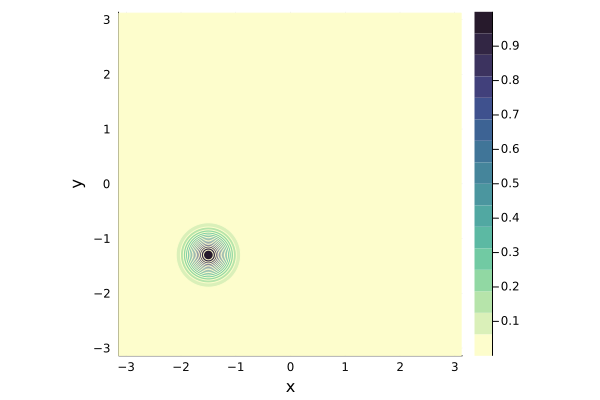

In [8]:
x, y = grid.x, grid.y

# two sources far appart
x₀, y₀, σ = -1.5, -1.3, 0.25
mask = [exp(-(x[i] - x₀)^2/2σ^2-(y[j] - y₀)^2/2σ^2) for i in 1:grid.nx, j in 1:grid.ny]
filename_descriptor = "_one_point_source"

# two sources far appart
# x₀, y₀, σ = -1.5, -1.3, 0.25
# mask = [exp(-(x[i] - x₀)^2/2σ^2-(y[j] - y₀)^2/2σ^2) + exp(-(x[i] - x₀)^2/2σ^2-(y[j] + y₀)^2/2σ^2) for i in 1:grid.nx, j in 1:grid.ny]
# filename_descriptor = "_two_point_sources_far"

# two sources closer togather
# x₀, y₀, σ = -1.5, -0.5, 0.25
# mask = [exp(-(x[i] - x₀)^2/2σ^2-(y[j] - y₀)^2/2σ^2) + exp(-(x[i] - x₀)^2/2σ^2-(y[j] + y₀)^2/2σ^2) for i in 1:grid.nx, j in 1:grid.ny]
# filename_descriptor = "_two_point_sources_close"


contourf(grid.x, grid.y, mask',
         color = :deep,
         xlims = (-grid.Lx/2, grid.Lx/2),
         ylims = (-grid.Ly/2, grid.Ly/2),
        xticks = -3:3,
        yticks = -3:3,
        xlabel = "x",
        ylabel = "y",    
   aspectratio = 1)

In [9]:
random_uniform = dev==CPU() ? rand : CUDA.rand

F = zeros(grid.nx, grid.ny)

function calcF!(Fh, sol, t, clock, vars, params, grid)
  Fh .= sqrt.(forcing_spectrum) .* exp.(2π * im * random_uniform(eltype(grid), size(sol))) ./ sqrt(clock.dt)
  
  ldiv!(F, grid.rfftplan, Fh)
    
  @. F *= mask
  F .-= mean(F)
    
  mul!(Fh, grid.rfftplan, F)
  
  return nothing
end
nothing # hide

## Problem setup
We initialize a `Problem` by providing a set of keyword arguments. Not providing
a viscosity coefficient ν leads to the module's default value: ν=0. In this
example numerical instability due to accumulation of enstrophy in high wavenumbers
is taken care with the `FilteredTimestepper` we picked.

In [10]:
prob = SingleLayerQG.Problem(dev; nx=n, Lx=L, β=β, μ=μ, dt=dt, stepper=stepper,
                             calcF=calcF!, stochastic=true)
nothing # hide

Let's define some shortcuts.

In [11]:
sol, clock, vars, params, grid = prob.sol, prob.clock, prob.vars, prob.params, prob.grid
x, y = grid.x, grid.y
nothing # hide

First let's see how a forcing realization looks like. Note that when plotting, we decorate
the variable to be plotted with `Array()` to make sure it is brought back on the CPU when
`vars` live on the GPU.

In [12]:
calcF!(vars.Fh, sol, 0.0, clock, vars, params, grid)

heatmap(x, y, Array(irfft(vars.Fh, grid.nx)'),
     aspectratio = 1,
               c = :balance,
            clim = (-8, 8),
           xlims = (-grid.Lx/2, grid.Lx/2),
           ylims = (-grid.Ly/2, grid.Ly/2),
          xticks = -3:3,
          yticks = -3:3,
          xlabel = "x",
          ylabel = "y",
           title = "a forcing realization",
      framestyle = :box)

savefig("forcing_realization"*filename_descriptor*".png")

## Setting initial conditions

Our initial condition is simply fluid at rest.

In [13]:
SingleLayerQG.set_q!(prob, ArrayType(dev)(zeros(grid.nx, grid.ny)))

## Diagnostics

Create Diagnostic -- `energy` and `enstrophy` are functions imported at the top.

In [14]:
E = Diagnostic(SingleLayerQG.energy, prob; nsteps=nsteps)
Z = Diagnostic(SingleLayerQG.enstrophy, prob; nsteps=nsteps)
diags = [E, Z] # A list of Diagnostics types passed to "stepforward!" will  be updated every timestep.
nothing # hide

## Output

We choose folder for outputing `.jld2` files and snapshots (`.png` files).

In [15]:
filepath = "."
plotpath = "./plots_forcedbetaturb"
plotname = "snapshots"
filename = joinpath(filepath, "forcedbetaturb.jld2")
nothing # hide

Do some basic file management,

In [16]:
if isfile(filename); rm(filename); end
if !isdir(plotpath); mkdir(plotpath); end
nothing # hide

and then create Output.

In [17]:
get_sol(prob) = sol # extracts the Fourier-transformed solution
get_u(prob) = irfft(im * grid.l .* grid.invKrsq .* sol, grid.nx)
out = Output(prob, filename, (:sol, get_sol), (:u, get_u))
nothing # hide

## Visualizing the simulation

We define a function that plots the vorticity and streamfunction fields, their
corresponding zonal mean structure and timeseries of energy and enstrophy.

In [18]:
function plot_output(prob)
  q = prob.vars.q
  ψ = prob.vars.ψ
  q̄ = mean(q, dims=1)'
  ū = mean(prob.vars.u, dims=1)'
    
  nondim_finaltime = prob.params.μ * nsteps * dt

  pq = heatmap(x, y, Array(q'),
       aspectratio = 1,
            legend = false,
                 c = :balance,
              clim = (-2, 2),
             xlims = (-grid.Lx/2, grid.Lx/2),
             ylims = (-grid.Ly/2, grid.Ly/2),
            xticks = -3:3,
            yticks = -3:3,
            xlabel = "x",
            ylabel = "y",
             title = "vorticity ∂v/∂x-∂u/∂y",
        framestyle = :box)

  pψ = contourf(x, y, Array(ψ'),
            levels = -0.07:0.005:0.07,
       aspectratio = 1,
         linewidth = 1,
            legend = false,
              clim = (-0.04, 0.04),
                 c = :viridis,
             xlims = (-grid.Lx/2, grid.Lx/2),
             ylims = (-grid.Ly/2, grid.Ly/2),
            xticks = -3:3,
            yticks = -3:3,
            xlabel = "x",
            ylabel = "y",
             title = "streamfunction ψ",
        framestyle = :box)

  pqm = plot(Array(q̄), y,
            legend = false,
         linewidth = 2,
             alpha = 0.7,
            yticks = -3:3,
             xlims = (-0.7, 0.7),
            xlabel = "zonal mean q",
            ylabel = "y")
  plot!(pqm, 0*y, y, linestyle=:dash, linecolor=:black)

  pum = plot(Array(ū), y,
            legend = false,
         linewidth = 2,
             alpha = 0.7,
            yticks = -3:3,
             xlims = (-0.1, 0.1),
            xlabel = "zonal mean u",
            ylabel = "y")
  plot!(pum, 0*y, y, linestyle=:dash, linecolor=:black)

  pE = plot(1,
             label = "energy",
            legend = :bottomright,
         linewidth = 2,
             alpha = 0.7,
             xlims = (-0.1, nondim_finaltime + 0.1),
             ylims = (0, 0.0007),
            xlabel = "μt")

  pZ = plot(1,
             label = "enstrophy",
         linecolor = :red,
            legend = :bottomright,
         linewidth = 2,
             alpha = 0.7,
             xlims = (-0.1, nondim_finaltime + 0.1),
             ylims = (0, 0.1),
            xlabel = "μt")

  l = @layout Plots.grid(2, 3)
  p = plot(pq, pqm, pE, pψ, pum, pZ, layout=l, size = (1000, 600))

  return p
end
nothing # hide

## Time-stepping the `Problem` forward

We time-step the `Problem` forward in time.

In [19]:
startwalltime = time()

p = plot_output(prob)

anim = @animate for j = 0:Int(nsteps / nsubs)

  if j % (1000 / nsubs) == 0
    cfl = clock.dt * maximum([maximum(vars.u) / grid.dx, maximum(vars.v) / grid.dy])

    log = @sprintf("step: %04d, t: %d, cfl: %.2f, E: %.4f, Q: %.4f, walltime: %.2f min",
    clock.step, clock.t, cfl, E.data[E.i], Z.data[Z.i], (time()-startwalltime)/60)

    println(log)
  end

  p[1][1][:z] = Array(vars.q)
  p[1][:title] = "vorticity, μt="*@sprintf("%.2f", μ * clock.t)
  p[4][1][:z] = Array(vars.ψ)
  p[2][1][:x] = Array(mean(vars.q, dims=1)')
  p[5][1][:x] = Array(mean(vars.u, dims=1)')
  push!(p[3][1], μ * E.t[E.i], E.data[E.i])
  push!(p[6][1], μ * Z.t[Z.i], Z.data[Z.i])

  stepforward!(prob, diags, nsubs)
  SingleLayerQG.updatevars!(prob)
end

mp4(anim, "bubblejet"*filename_descriptor*".mp4", fps=16)

step: 0000, t: 0, cfl: 0.00, E: 0.0000, Q: 0.0000, walltime: 0.04 min
step: 1000, t: 100, cfl: 0.55, E: 0.0002, Q: 0.0347, walltime: 0.62 min
step: 2000, t: 200, cfl: 0.78, E: 0.0003, Q: 0.0398, walltime: 1.15 min
step: 3000, t: 300, cfl: 0.59, E: 0.0003, Q: 0.0335, walltime: 1.67 min
step: 4000, t: 400, cfl: 0.55, E: 0.0002, Q: 0.0295, walltime: 2.19 min
step: 5000, t: 500, cfl: 0.50, E: 0.0002, Q: 0.0304, walltime: 2.72 min
step: 6000, t: 600, cfl: 0.62, E: 0.0002, Q: 0.0368, walltime: 3.26 min
step: 7000, t: 700, cfl: 0.64, E: 0.0003, Q: 0.0419, walltime: 3.80 min
step: 8000, t: 800, cfl: 0.78, E: 0.0003, Q: 0.0398, walltime: 4.33 min


┌ Info: Saved animation to 
│   fn = /Users/navid/Research/BubbleJets/bubblejet_one_point_source.mp4
└ @ Plots /Users/navid/.julia/packages/Plots/yfzIY/src/animation.jl:114


Plots.AnimatedGif("/Users/navid/Research/BubbleJets/bubblejet_one_point_source.mp4")